In [556]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import json

In [557]:
show_bbox = True

In [558]:
# Get paths for two sets of point clouds and labels
index = '0036'
kitti_data = f'../../../mmdetection3d/data/kitti/training/velodyne_reduced/00{index}.bin'
kitti_label = f'../../../mmdetection3d/data/kitti/training/label_2/00{index}.txt'
arcs_date = f'../../../mmdetection3d/data/arcs/training/velodyne/00{index}.bin'
arcs_label = f'../../../mmdetection3d/data/arcs/training/label_2/00{index}.txt'
unfiltered_kitti_data = f'../../../mmdetection3d/data/st_kitti_unfiltered/training/velodyne/00{index}.bin'
unfiltered_kitti_label = f'../../../mmdetection3d/data/st_kitti_unfiltered/training/label_2/00{index}.txt'

In [559]:
kitti_gt_data = f'../../../mmdetection3d/data/kitti/kitti_gt_database/2640_Van_1.bin'
arcs_gt_data = f'../../../mmdetection3d/data/arcs/arcs_gt_database/997_Van_0.bin'

In [560]:
# Copy over the visualization code
# Function to plot the bounding box
def plot_bbox(ax, bbox):
    # Bounding box order that displays pointpillars predictions correctly   
    dz, dy, dx, x, y, z, yaw = bbox
    
    corners = np.array([
        [x - dx/2, y - dy/2, z - dz/2],
        [x + dx/2, y - dy/2, z - dz/2],
        [x + dx/2, y + dy/2, z - dz/2],
        [x - dx/2, y + dy/2, z - dz/2],
        [x - dx/2, y - dy/2, z + dz/2],
        [x + dx/2, y - dy/2, z + dz/2],
        [x + dx/2, y + dy/2, z + dz/2],
        [x - dx/2, y + dy/2, z + dz/2]
    ])
    

    # Rotate corners around the Z-axis (around their centers)
    rotation_matrix = np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw),  np.cos(yaw), 0],
        [0,            0,           1]
    ])

    # # Adjust the corners to be about the origin for rotation, then add the [x, y, z] back after rotation
    corners = corners - np.array([x, y, z])
    corners = np.dot(corners, rotation_matrix.T)
    corners += np.array([x, y, z])
    
    # Define the edges of the bounding box
    edges = [
        (0, 1), (1, 2), (2, 3), (3, 0),
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6), (3, 7)
    ]
    # Plot the edges
    for edge in edges:
        ax.plot3D(*zip(corners[edge[0]], corners[edge[1]]), color='r', linewidth=1)

In [561]:
def set_axes_equal(ax):
    '''Make axes of 3D plot have equal scale so that spheres appear as spheres,
    cubes as cubes, etc..  This is one possible solution to Matplotlib's
    ax.set_aspect('equal') and ax.axis('equal') not working for 3D.'''
    
    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()

    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)

    # The plot bounding box is a sphere in the sense of the infinity
    # norm, hence I call half the max range the 'box size'.
    box_size = max([x_range, y_range, z_range]) / 2.0

    ax.set_xlim3d([x_middle - box_size, x_middle + box_size])
    ax.set_ylim3d([y_middle - box_size, y_middle + box_size])
    ax.set_zlim3d([z_middle - box_size, z_middle + box_size])

In [562]:
def read_kitti_labels(label_path):
    bboxes = []
    with open(label_path, 'r') as file:
        for line in file:
            print(line)
            parts = line.strip().split()
            if parts[0] != 'DontCare':
                bbox = [float(value) for value in parts[8:15]]  # Extract the bounding box dimensions and location
                bboxes.append(bbox)
    return np.array(bboxes)

In [563]:
# See if the same parsing of values works for both sets

In [564]:
def plot_fig(bin_file_path, label_file_path=None, elev=90, point_size=1):
    points = np.fromfile(bin_file_path, dtype=np.float32).reshape(-1, 4)
    # Set up the plot
    fig = plt.figure(figsize=(40, 40))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the point cloud
    ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=point_size, c=points[:, 3], cmap='viridis', marker=',')

    score_threshold = 0.23

    # Plot each bounding box only if the score is above the threshold
    if show_bbox and label_file_path is not None:
        for bbox in read_kitti_labels(label_file_path):
            plot_bbox(ax, bbox)

    # Setting the axes properties
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    # Adjust the view angle if needed
    ax.view_init(elev=elev, azim=210) # You can change these angles to get a better view

    # Fix aspect ratio
    set_axes_equal(ax)

    plt.show()

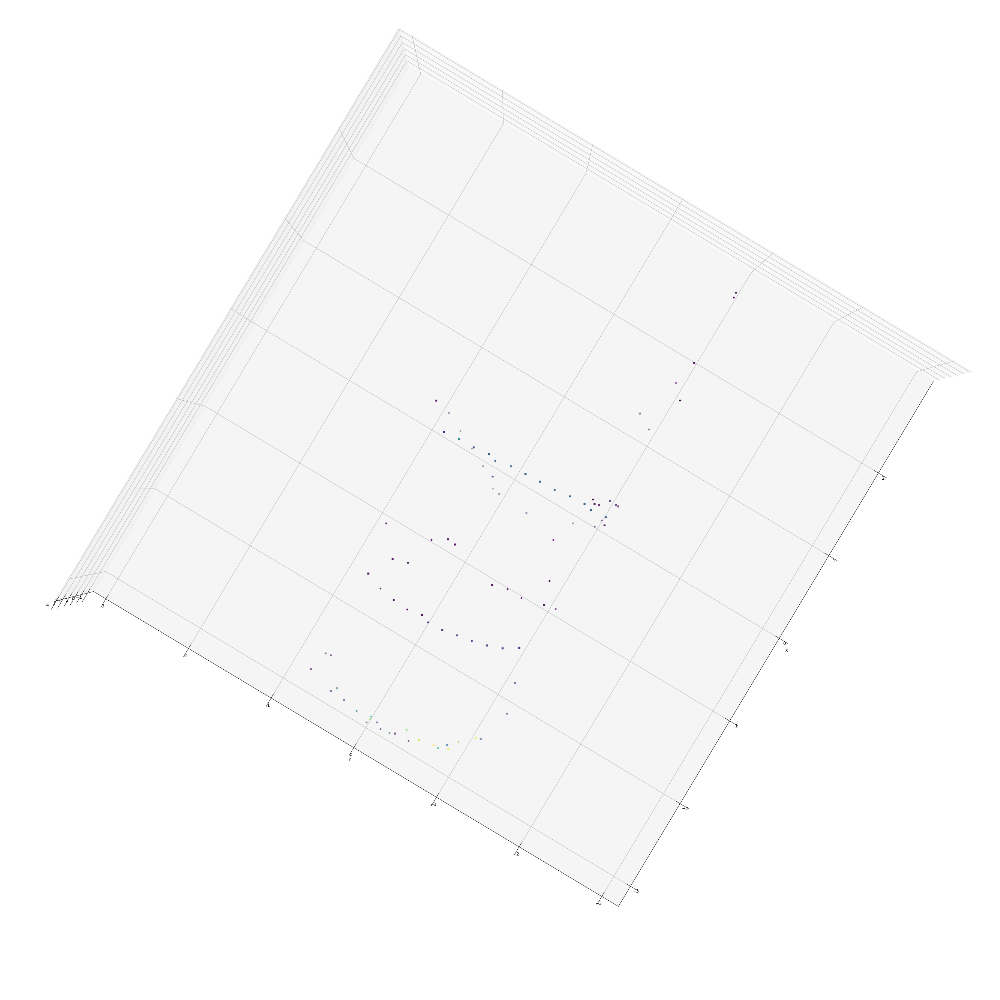

In [565]:
plot_fig(kitti_gt_data, elev=90, point_size=10)

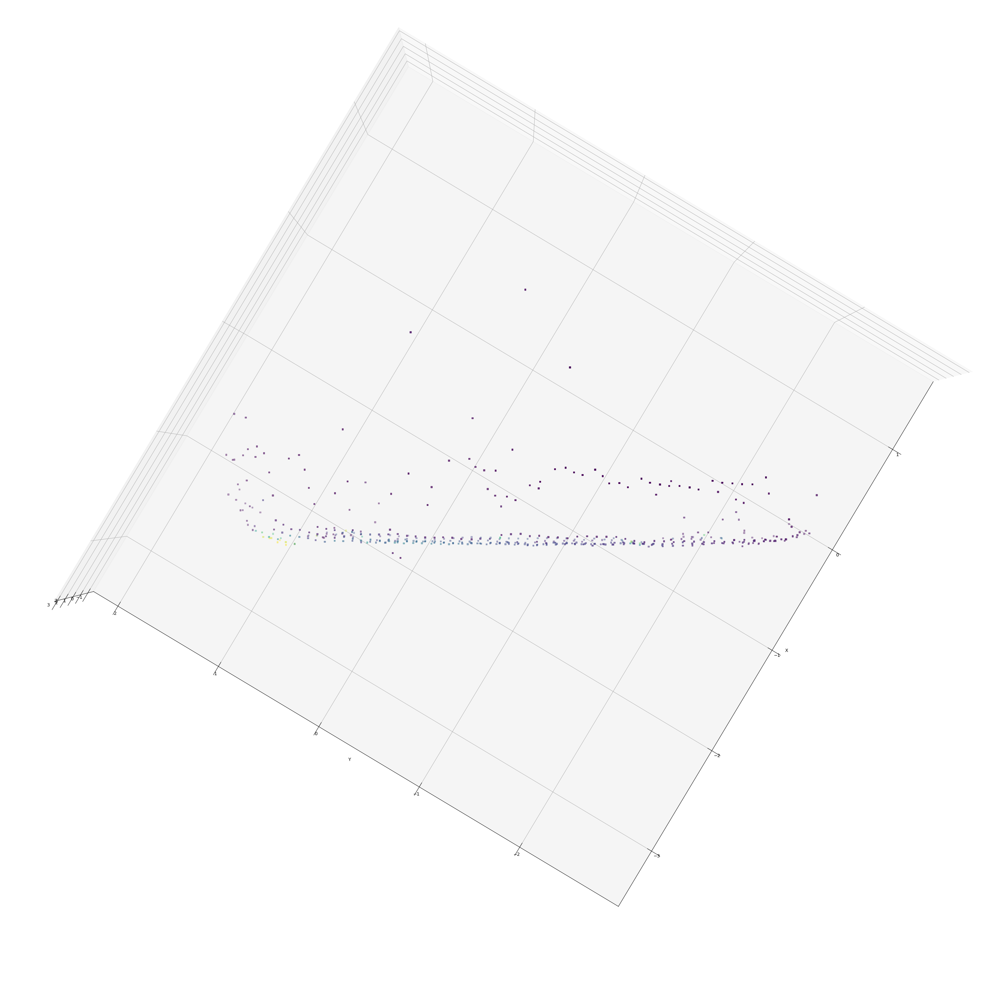

In [566]:
plot_fig(arcs_gt_data, elev=90, point_size=10)

Car 0.00 0 -1.58 553.16 178.73 693.67 311.88 1.55 1.63 3.32 0.11 1.64 10.13 -1.57

Car 0.00 0 1.89 341.05 194.66 390.28 218.73 1.37 1.82 3.96 -15.54 2.81 46.01 1.56

Car 0.00 0 2.03 286.23 196.48 337.13 220.85 1.38 1.79 2.94 -18.46 2.88 44.69 1.64

Car 0.00 0 1.82 412.76 190.23 455.28 212.54 1.40 1.75 4.75 -12.25 2.66 50.40 1.58

Car 0.00 1 2.67 960.19 183.87 1104.42 229.69 1.59 1.73 4.26 15.49 2.03 26.68 -3.09

Car 0.39 3 2.53 1154.43 178.14 1241.00 222.29 1.55 1.76 3.59 22.52 1.76 26.55 -3.06

Car 0.97 3 -2.06 1123.12 213.78 1241.00 374.00 1.30 1.64 3.71 4.52 1.63 4.08 -1.26

DontCare -1 -1 -10 161.65 196.90 204.40 214.65 -1 -1 -1 -1000 -1000 -1000 -10

DontCare -1 -1 -10 434.56 181.27 484.60 195.90 -1 -1 -1 -1000 -1000 -1000 -10



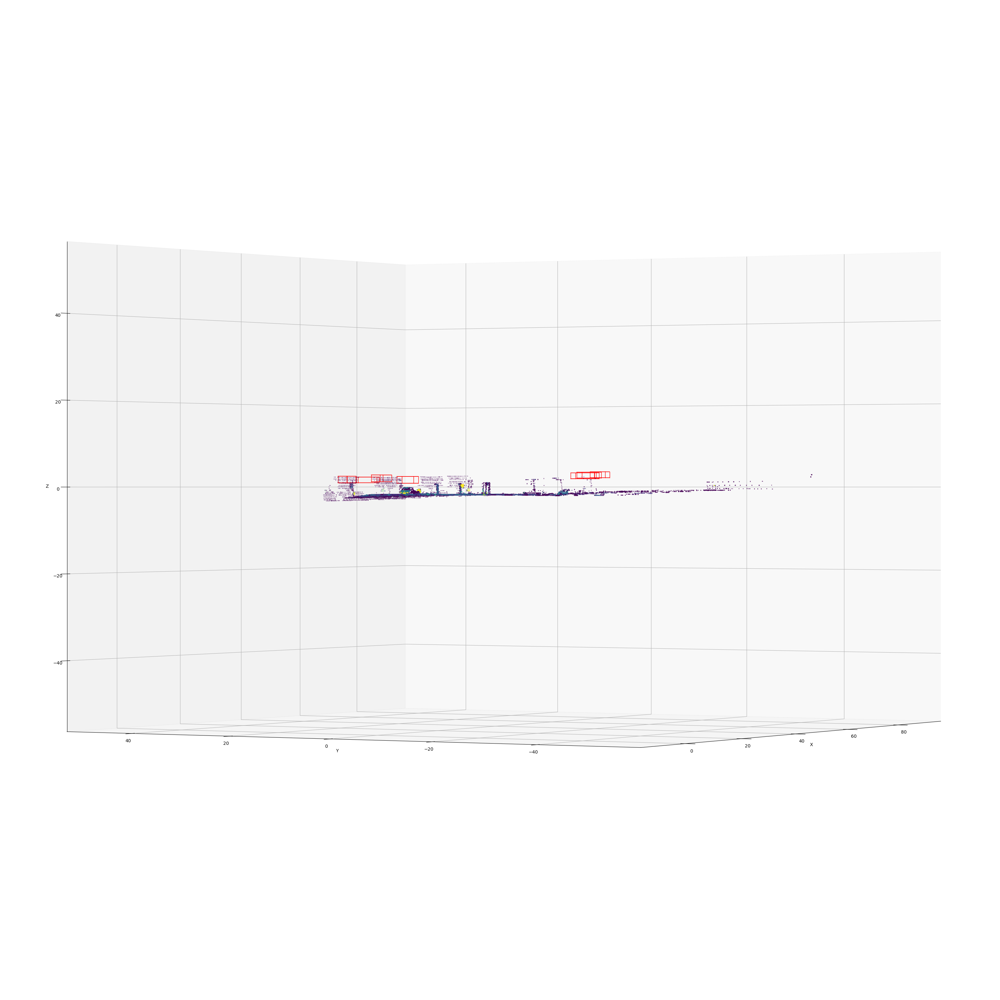

In [567]:
plot_fig(kitti_data, kitti_label, elev=0)

Car 0.00 0 -1.58 553.16 178.73 693.67 311.88 1.55 1.63 3.32 0.11 1.64 10.13 -1.57

Car 0.00 0 1.89 341.05 194.66 390.28 218.73 1.37 1.82 3.96 -15.54 2.81 46.01 1.56

Car 0.00 0 2.03 286.23 196.48 337.13 220.85 1.38 1.79 2.94 -18.46 2.88 44.69 1.64

Car 0.00 0 1.82 412.76 190.23 455.28 212.54 1.40 1.75 4.75 -12.25 2.66 50.40 1.58

Car 0.00 1 2.67 960.19 183.87 1104.42 229.69 1.59 1.73 4.26 15.49 2.03 26.68 -3.09

Car 0.39 3 2.53 1154.43 178.14 1241.00 222.29 1.55 1.76 3.59 22.52 1.76 26.55 -3.06

Car 0.97 3 -2.06 1123.12 213.78 1241.00 374.00 1.30 1.64 3.71 4.52 1.63 4.08 -1.26

DontCare -1 -1 -10 161.65 196.90 204.40 214.65 -1 -1 -1 -1000 -1000 -1000 -10

DontCare -1 -1 -10 434.56 181.27 484.60 195.90 -1 -1 -1 -1000 -1000 -1000 -10



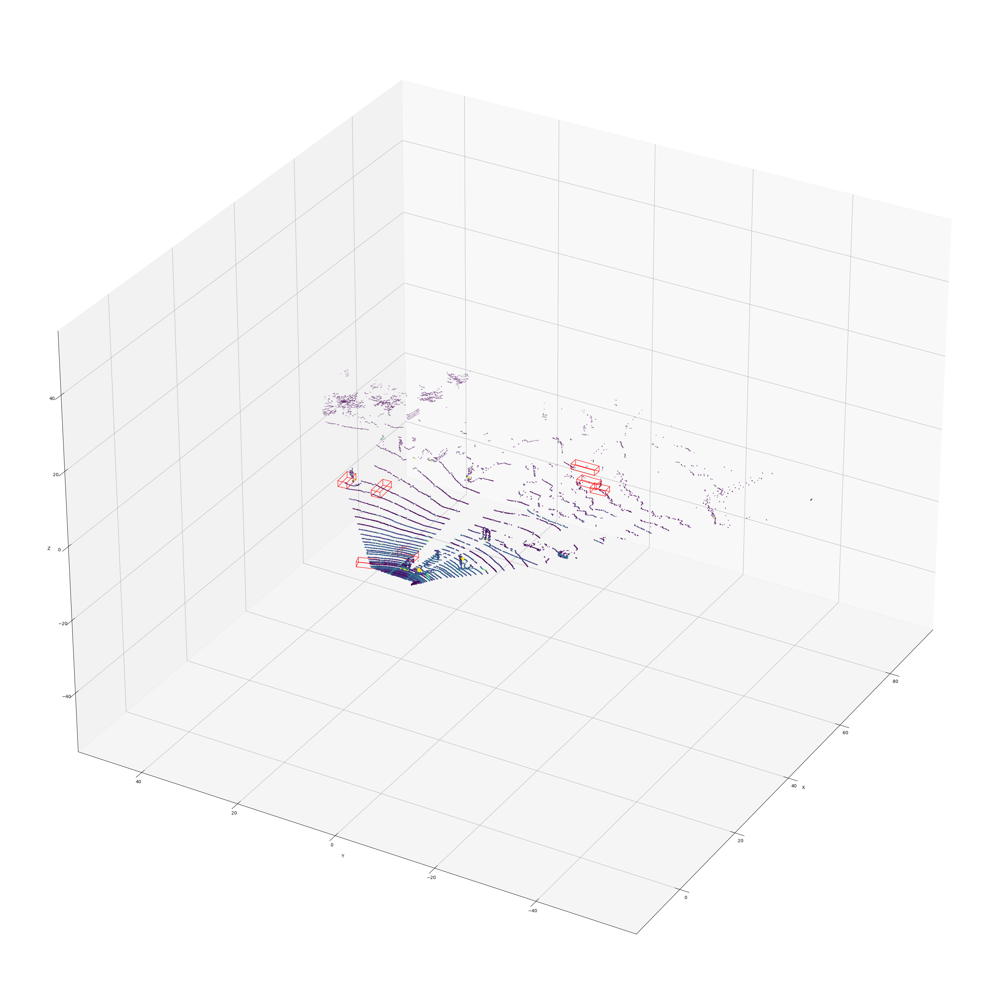

In [568]:
plot_fig(kitti_data, kitti_label, elev=30)

Car 0.00 0 -1.58 553.16 178.73 693.67 311.88 1.55 1.63 3.32 0.11 1.64 10.13 -1.57

Car 0.00 0 1.89 341.05 194.66 390.28 218.73 1.37 1.82 3.96 -15.54 2.81 46.01 1.56

Car 0.00 0 2.03 286.23 196.48 337.13 220.85 1.38 1.79 2.94 -18.46 2.88 44.69 1.64

Car 0.00 0 1.82 412.76 190.23 455.28 212.54 1.40 1.75 4.75 -12.25 2.66 50.40 1.58

Car 0.00 1 2.67 960.19 183.87 1104.42 229.69 1.59 1.73 4.26 15.49 2.03 26.68 -3.09

Car 0.39 3 2.53 1154.43 178.14 1241.00 222.29 1.55 1.76 3.59 22.52 1.76 26.55 -3.06

Car 0.97 3 -2.06 1123.12 213.78 1241.00 374.00 1.30 1.64 3.71 4.52 1.63 4.08 -1.26

DontCare -1 -1 -10 161.65 196.90 204.40 214.65 -1 -1 -1 -1000 -1000 -1000 -10

DontCare -1 -1 -10 434.56 181.27 484.60 195.90 -1 -1 -1 -1000 -1000 -1000 -10



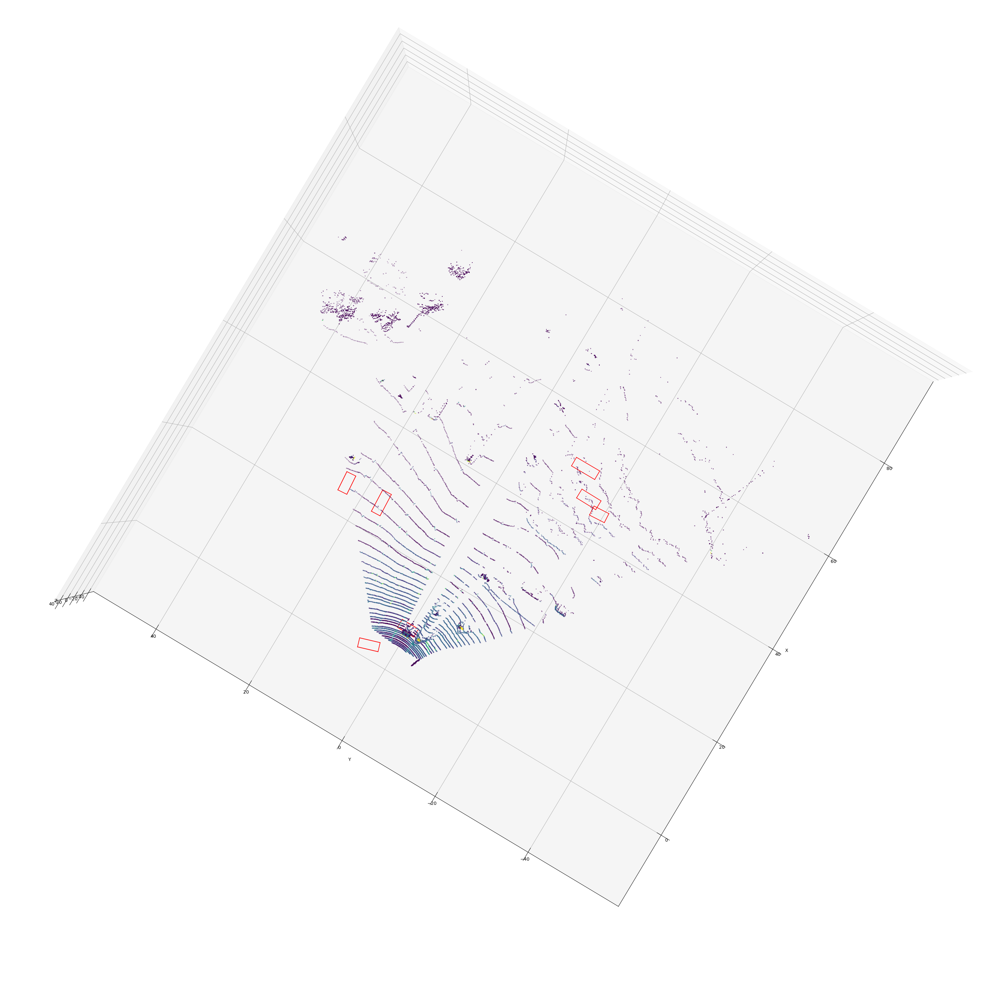

In [569]:
plot_fig(kitti_data, kitti_label, elev=90)

Car 0.0 0 -0.37 0.0 0.0 0.0 0.0 1.91 3.18 5.14 -20.85 -0.78 10.68 -1.27

Car 0.0 0 -2.66 0.0 0.0 0.0 0.0 2.02 2.71 4.95 -30.38 -0.21 26.84 -5.2

Car 0.0 0 -2.65 0.0 0.0 0.0 0.0 2.13 2.48 5.36 -28.66 -0.11 29.51 -5.21



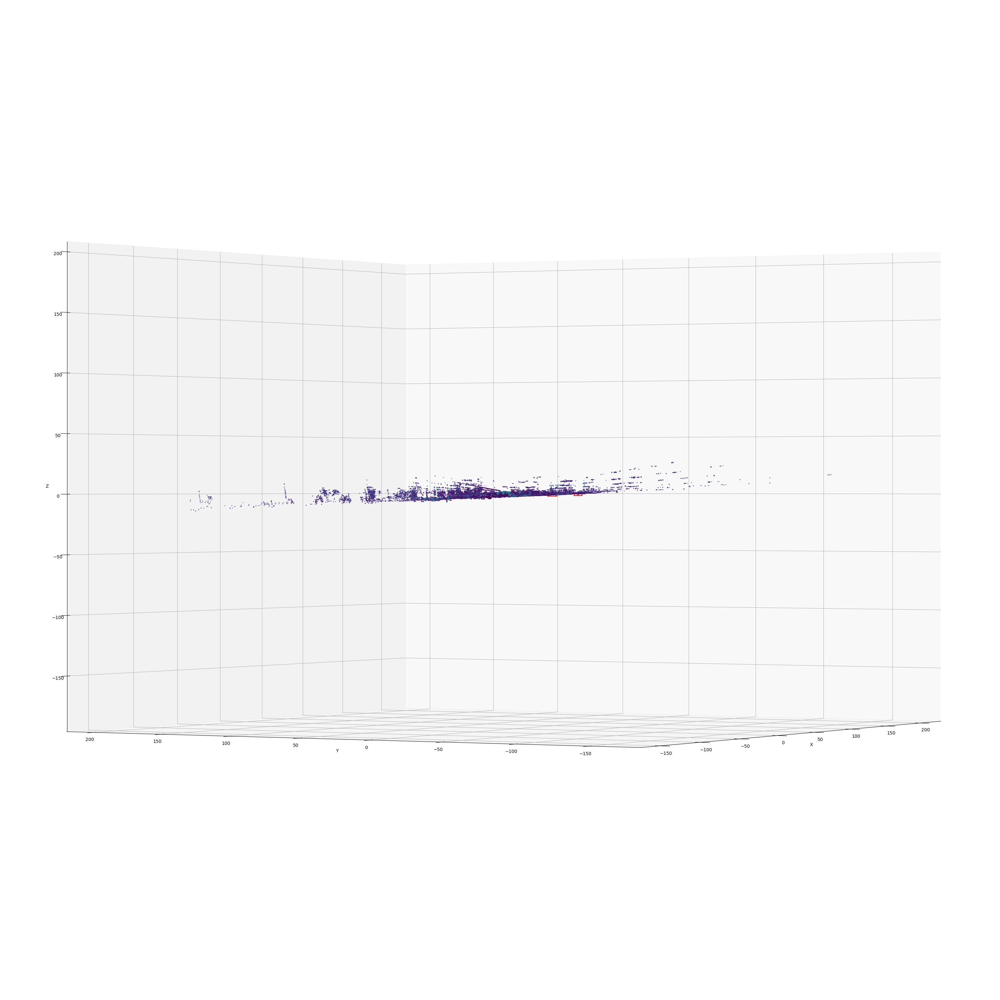

In [570]:
plot_fig(arcs_date, arcs_label, elev=0)

Car 0.0 0 -0.37 0.0 0.0 0.0 0.0 1.91 3.18 5.14 -20.85 -0.78 10.68 -1.27

Car 0.0 0 -2.66 0.0 0.0 0.0 0.0 2.02 2.71 4.95 -30.38 -0.21 26.84 -5.2

Car 0.0 0 -2.65 0.0 0.0 0.0 0.0 2.13 2.48 5.36 -28.66 -0.11 29.51 -5.21



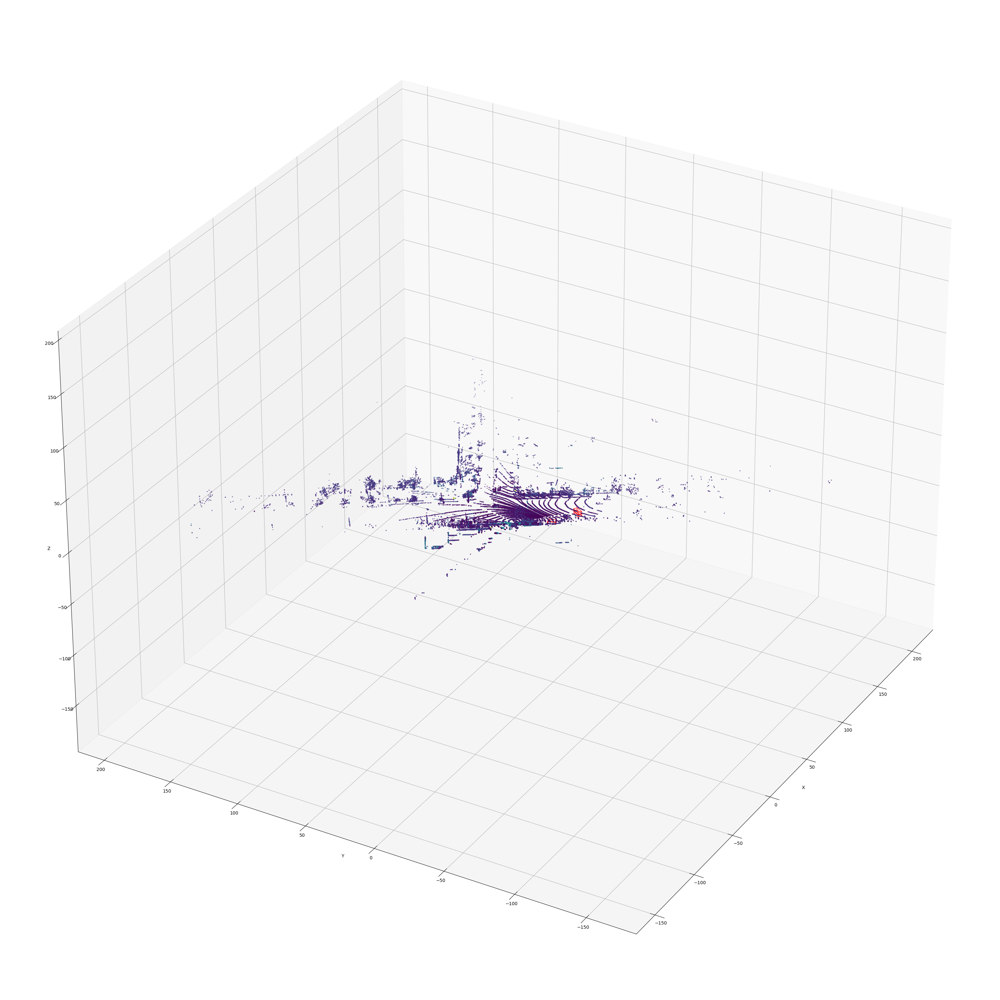

In [571]:
plot_fig(arcs_date, arcs_label, elev=30)

Car 0.0 0 -0.37 0.0 0.0 0.0 0.0 1.91 3.18 5.14 -20.85 -0.78 10.68 -1.27

Car 0.0 0 -2.66 0.0 0.0 0.0 0.0 2.02 2.71 4.95 -30.38 -0.21 26.84 -5.2

Car 0.0 0 -2.65 0.0 0.0 0.0 0.0 2.13 2.48 5.36 -28.66 -0.11 29.51 -5.21



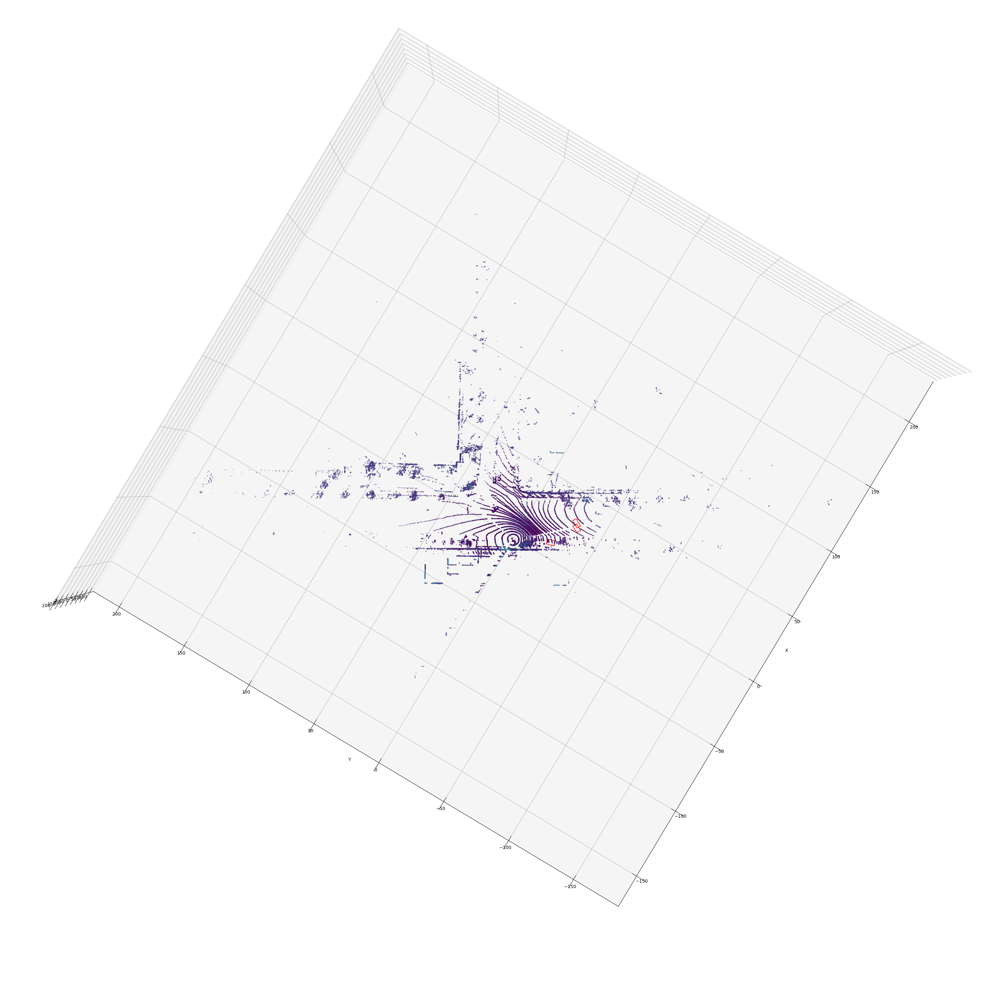

In [572]:
plot_fig(arcs_date, arcs_label, elev=90)

 Car 0.0 0 0.0 0.0 0.0 0.0 0.0 1.5 4.56 1.74 3.75 -1.6 13.35 1.8

 Car 0.0 0 0.0 0.0 0.0 0.0 0.0 1.57 4.09 1.65 -13.37 -1.47 16.45 1.76


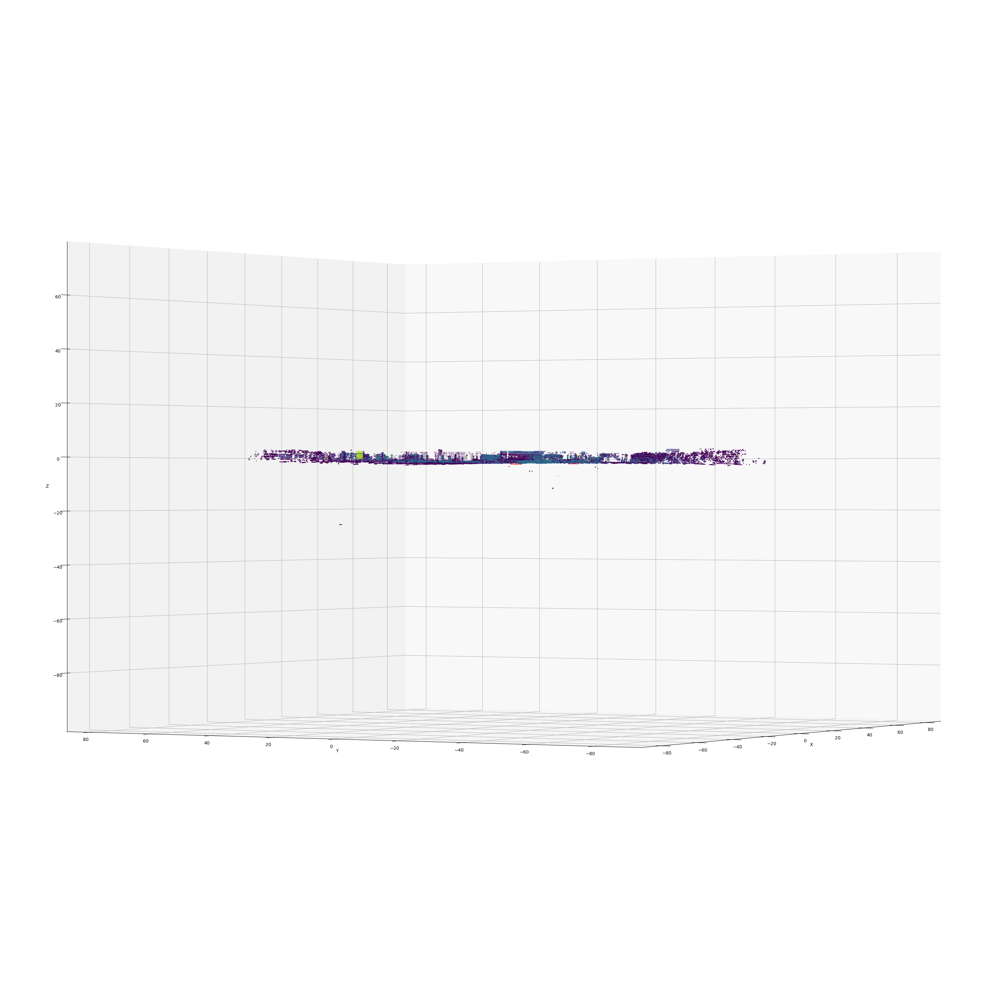

In [573]:
plot_fig(unfiltered_kitti_data, unfiltered_kitti_label, elev=0)

 Car 0.0 0 0.0 0.0 0.0 0.0 0.0 1.5 4.56 1.74 3.75 -1.6 13.35 1.8

 Car 0.0 0 0.0 0.0 0.0 0.0 0.0 1.57 4.09 1.65 -13.37 -1.47 16.45 1.76


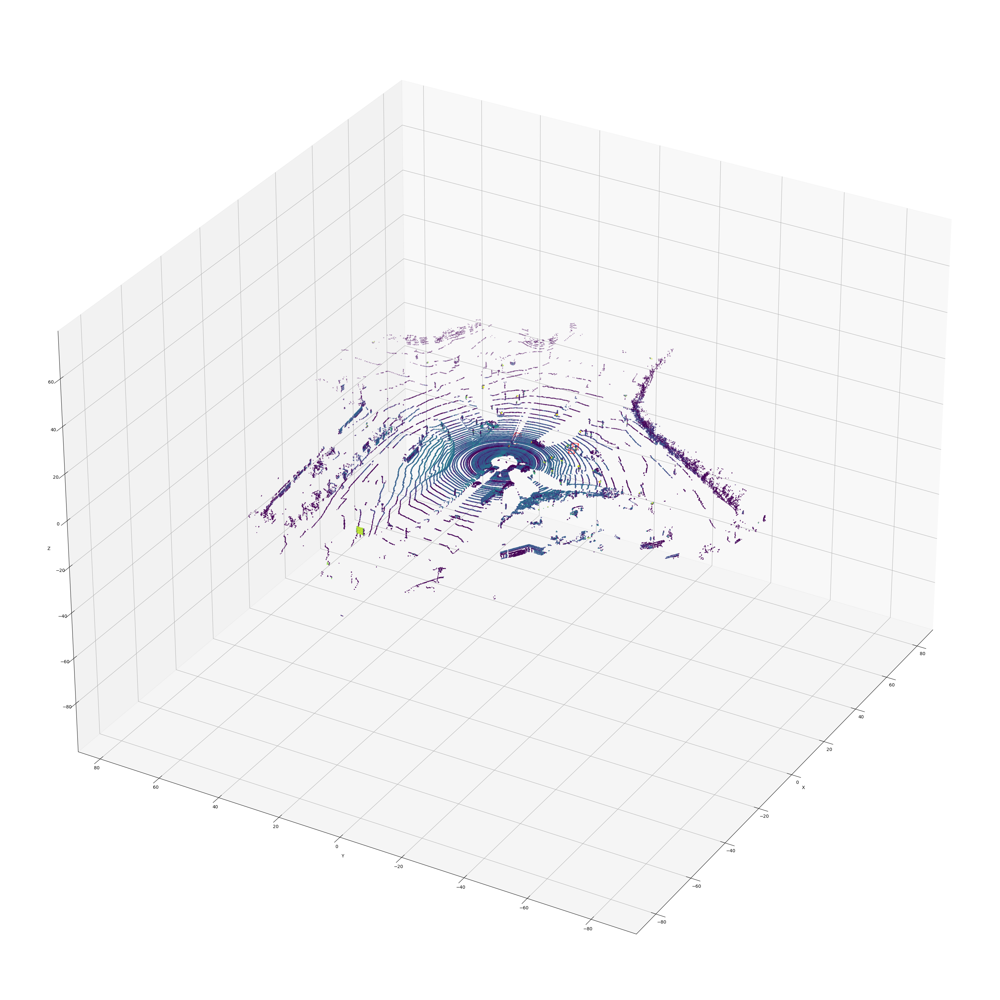

In [574]:
plot_fig(unfiltered_kitti_data, unfiltered_kitti_label, elev=30)

 Car 0.0 0 0.0 0.0 0.0 0.0 0.0 1.5 4.56 1.74 3.75 -1.6 13.35 1.8

 Car 0.0 0 0.0 0.0 0.0 0.0 0.0 1.57 4.09 1.65 -13.37 -1.47 16.45 1.76


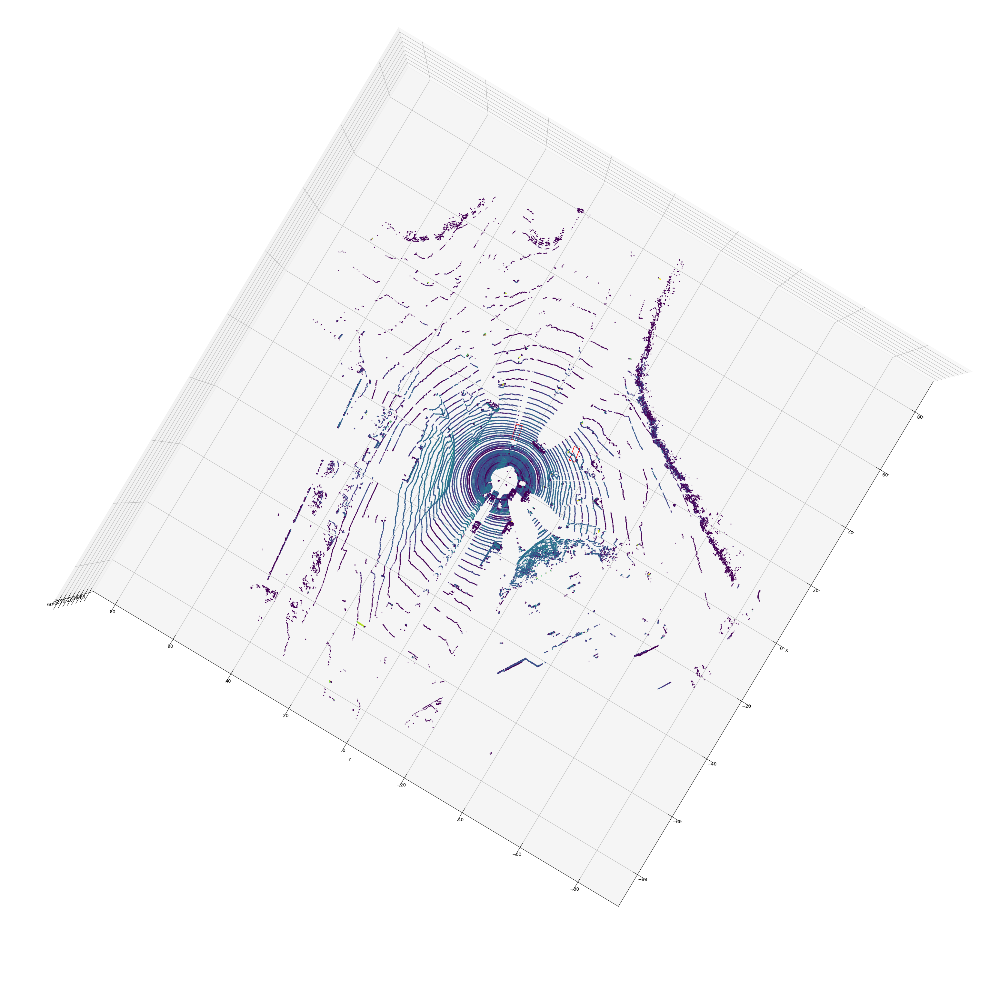

In [575]:
plot_fig(unfiltered_kitti_data, unfiltered_kitti_label, elev=90)